# Daisyworld: 1D

In [1]:
# Import
import numpy as np
import matplotlib.pyplot as plt
import utils1d

In [2]:
# Define Parameters
L = 1.000        # Luminosity
ai = 0.75        # Daisy Albedo
ag = 0.5         # Ground Albedo
R = 0.2          # Insulation Constant
S = 917          # Solar Constant
sigma = 5.67e-8  # Stefan-Boltzmann Constant
Ti = 22.5        # Ideal Growth Temperature
gamma = 0.3      # Death Rate

In [3]:
# dA/dt Function
def v(A, L):
    ap = A * ai + (1 - A) * ag  # Planet Albedo
    Te = (L * (S / sigma) * (1 - ap)) ** 0.25  # Planet Temp
    T = (R * L * (S / sigma) * (ap - ai) + (Te ** 4)) ** 0.25  # Black Daisy Temp
    b = 1 - (0.003265 * ((273.15 + Ti) - T) ** 2)  # Black Daisy Growth Rate
    return A * ((1 - A) * b - gamma)

### Time Iteration Picture

In [4]:
# Forward-Euler Trajectory

dt = 0.025
time = np.arange(0, 10, dt)

initial_A = 0.92  # whatever value you want here
areas = np.zeros(len(time))

A = initial_A
for i in range(len(time)):
    areas[i] = A
    A += v(A, L) * dt

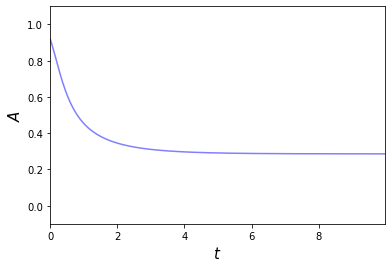

In [5]:
# Plot
utils1d.plot_time_iteration(time, areas)

### Space State Picture

In [6]:
# Find dA/dt at every value of A
arr_A = np.linspace(0, 1, num=101)
arr_v = v(arr_A, L)

In [7]:
# Find equilibria
equilibria = utils1d.equilibrium(v, L)
print(equilibria)

([0.0, 0.28588], ['Unstable', 'Stable'])


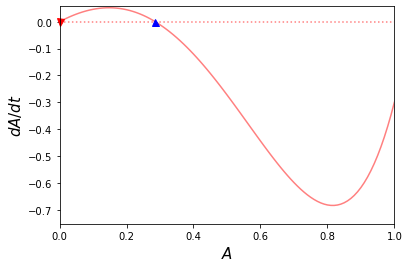

In [8]:
# Plot
utils1d.plot_state_space(arr_A, arr_v, eqs=equilibria)

### Complete Picture

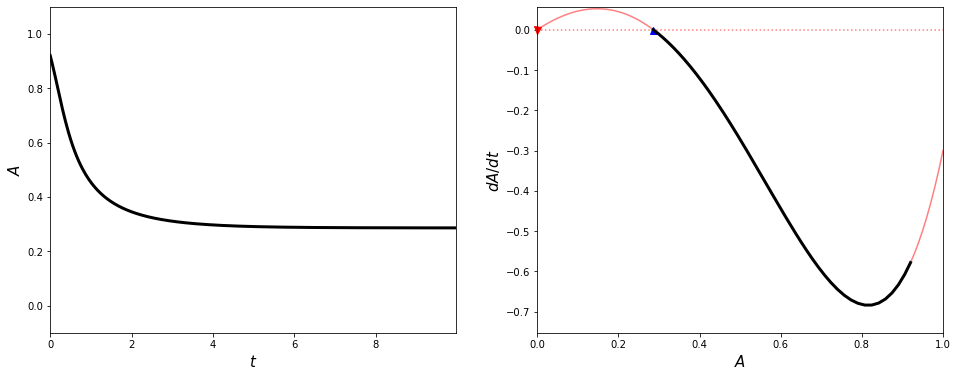

In [9]:
# Animated Comparison (try for different initial area values)
t_data = (time, areas)
s_data = (arr_A, arr_v)
v_data = v(areas, L)

ani = utils1d.animated_comparison(t_data, s_data, v_data, equilibria)

# Display
from IPython.display import HTML
HTML(ani.to_jshtml())

In [10]:
# Bifurcation Plot with respect to Luminosity
lumins = np.arange(0.5, 1.8, 0.02)
eqs = []
for l in lumins:
    eqs.append(utils1d.equilibrium(v, l))

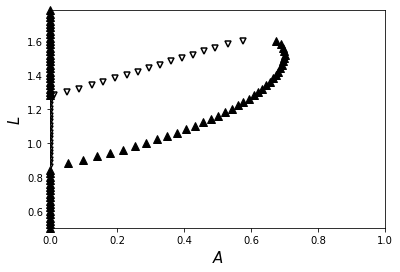

In [11]:
utils1d.plot_bifurcation(lumins, eqs)